<a href="https://colab.research.google.com/github/KillerStrike17/EVA-5/blob/master/9.%20GradCAM%20and%20Augmentation/GradCAM_and_Augmentations.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!nvidia-smi

Sat Oct  3 16:46:00 2020       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 455.23.05    Driver Version: 418.67       CUDA Version: 10.1     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   51C    P8    10W /  70W |      0MiB / 15079MiB |      0%      Default |
|                               |                      |                 ERR! |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [2]:
!git clone https://github.com/KillerStrike17/PyDeNN.git

Cloning into 'PyDeNN'...
remote: Enumerating objects: 254, done.
remote: Counting objects: 100% (254/254), done.
remote: Compressing objects: 100% (205/205), done.
remote: Total 254 (delta 75), reused 214 (delta 42), pack-reused 0
Receiving objects: 100% (254/254), 10.44 MiB | 10.88 MiB/s, done.
Resolving deltas: 100% (75/75), done.


In [3]:
%cd PyDeNN/

/content/PyDeNN


In [4]:
from DeNN.model import resnet
from DeNN.dataset_loader import data_loader, data_augmentation
from DeNN.trainer import trainer
from DeNN.visualization import * 
from DeNN.util import *

In [5]:
import torch,torchvision
from torchsummary import summary
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim


In [6]:
DATA_PATH = 'data/'
BATCH_SIZE =128

In [7]:
  my_transformations = data_augmentation.DataAugmentationCifar10_album()
  train, test = data_loader.DatasetCifar10(data_path = DATA_PATH,transformations = my_transformations,batch_size = BATCH_SIZE).load_data()

Extracting data/cifar-10-python.tar.gz to data/
Files already downloaded and verified


In [8]:
classes = ('plane', 'car', 'bird', 'cat',
           'deer', 'dog', 'frog', 'horse', 'ship', 'truck')

In [9]:
use_cuda = torch.cuda.is_available()
device = torch.device("cuda" if use_cuda else "cpu")
model = resnet.ResNet18().to(device)
summary(model,input_size=(3,32,32))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1           [-1, 64, 32, 32]           1,728
       BatchNorm2d-2           [-1, 64, 32, 32]             128
            Conv2d-3           [-1, 64, 32, 32]          36,864
       BatchNorm2d-4           [-1, 64, 32, 32]             128
            Conv2d-5           [-1, 64, 32, 32]          36,864
       BatchNorm2d-6           [-1, 64, 32, 32]             128
        BasicBlock-7           [-1, 64, 32, 32]               0
            Conv2d-8           [-1, 64, 32, 32]          36,864
       BatchNorm2d-9           [-1, 64, 32, 32]             128
           Conv2d-10           [-1, 64, 32, 32]          36,864
      BatchNorm2d-11           [-1, 64, 32, 32]             128
       BasicBlock-12           [-1, 64, 32, 32]               0
           Conv2d-13          [-1, 128, 16, 16]          73,728
      BatchNorm2d-14          [-1, 128,

In [10]:
criterion = nn.CrossEntropyLoss()
optimizer = optim.SGD(model.parameters(), lr=0.001, momentum=0.9)

In [11]:
device

device(type='cuda')

In [12]:
trainer = trainer.Trainer( model =model , optimizer =optimizer , device =device , train_loader = train, test_loader = test,epochs = 75,criteria = criterion)

In [13]:
(w,x),(y,z) = trainer.train()

  0%|          | 0/391 [00:00<?, ?it/s]

Epoch: 1


loss=1.3977725505828857 batch_id=390 Accuracy = 0.40566: 100%|██████████| 391/391 [01:18<00:00,  4.98it/s]
  0%|          | 0/391 [00:00<?, ?it/s]


Test set: Average loss: 0.0103, Accuracy: 5218/10000 (52.18%)

Epoch: 2


loss=1.0073273181915283 batch_id=390 Accuracy = 0.55896: 100%|██████████| 391/391 [01:20<00:00,  4.83it/s]
  0%|          | 0/391 [00:00<?, ?it/s]


Test set: Average loss: 0.0085, Accuracy: 6166/10000 (61.66%)

Epoch: 3


loss=1.0635403394699097 batch_id=390 Accuracy = 0.6337: 100%|██████████| 391/391 [01:20<00:00,  4.86it/s]
  0%|          | 0/391 [00:00<?, ?it/s]


Test set: Average loss: 0.0074, Accuracy: 6640/10000 (66.40%)

Epoch: 4


loss=1.0460574626922607 batch_id=390 Accuracy = 0.68608: 100%|██████████| 391/391 [01:20<00:00,  4.86it/s]
  0%|          | 0/391 [00:00<?, ?it/s]


Test set: Average loss: 0.0068, Accuracy: 7043/10000 (70.43%)

Epoch: 5


loss=0.8009438514709473 batch_id=390 Accuracy = 0.72194: 100%|██████████| 391/391 [01:20<00:00,  4.86it/s]
  0%|          | 0/391 [00:00<?, ?it/s]


Test set: Average loss: 0.0062, Accuracy: 7317/10000 (73.17%)

Epoch: 6


loss=0.6431622505187988 batch_id=390 Accuracy = 0.74704: 100%|██████████| 391/391 [01:20<00:00,  4.86it/s]
  0%|          | 0/391 [00:00<?, ?it/s]


Test set: Average loss: 0.0053, Accuracy: 7666/10000 (76.66%)

Epoch: 7


loss=0.6429910063743591 batch_id=390 Accuracy = 0.77084: 100%|██████████| 391/391 [01:20<00:00,  4.85it/s]
  0%|          | 0/391 [00:00<?, ?it/s]


Test set: Average loss: 0.0050, Accuracy: 7783/10000 (77.83%)

Epoch: 8


loss=0.6591147184371948 batch_id=390 Accuracy = 0.78418: 100%|██████████| 391/391 [01:20<00:00,  4.86it/s]
  0%|          | 0/391 [00:00<?, ?it/s]


Test set: Average loss: 0.0048, Accuracy: 7887/10000 (78.87%)

Epoch: 9


loss=0.6773305535316467 batch_id=390 Accuracy = 0.79932: 100%|██████████| 391/391 [01:20<00:00,  4.85it/s]
  0%|          | 0/391 [00:00<?, ?it/s]


Test set: Average loss: 0.0044, Accuracy: 8105/10000 (81.05%)

Epoch: 10


loss=0.4086097180843353 batch_id=390 Accuracy = 0.8126: 100%|██████████| 391/391 [01:19<00:00,  4.90it/s]
  0%|          | 0/391 [00:00<?, ?it/s]


Test set: Average loss: 0.0048, Accuracy: 7934/10000 (79.34%)

Epoch: 11


loss=0.5541508793830872 batch_id=390 Accuracy = 0.82256: 100%|██████████| 391/391 [01:19<00:00,  4.91it/s]
  0%|          | 0/391 [00:00<?, ?it/s]


Test set: Average loss: 0.0043, Accuracy: 8109/10000 (81.09%)

Epoch: 12


loss=0.6099634170532227 batch_id=390 Accuracy = 0.83418: 100%|██████████| 391/391 [01:19<00:00,  4.91it/s]
  0%|          | 0/391 [00:00<?, ?it/s]


Test set: Average loss: 0.0039, Accuracy: 8303/10000 (83.03%)

Epoch: 13


loss=0.5015119314193726 batch_id=390 Accuracy = 0.8427: 100%|██████████| 391/391 [01:19<00:00,  4.90it/s]
  0%|          | 0/391 [00:00<?, ?it/s]


Test set: Average loss: 0.0040, Accuracy: 8235/10000 (82.35%)

Epoch: 14


loss=0.5474764108657837 batch_id=390 Accuracy = 0.84962: 100%|██████████| 391/391 [01:20<00:00,  4.86it/s]
  0%|          | 0/391 [00:00<?, ?it/s]


Test set: Average loss: 0.0039, Accuracy: 8357/10000 (83.57%)

Epoch: 15


loss=0.4462592601776123 batch_id=390 Accuracy = 0.8565: 100%|██████████| 391/391 [01:20<00:00,  4.87it/s]
  0%|          | 0/391 [00:00<?, ?it/s]


Test set: Average loss: 0.0039, Accuracy: 8353/10000 (83.53%)

Epoch: 16


loss=0.3071051836013794 batch_id=390 Accuracy = 0.8604: 100%|██████████| 391/391 [01:20<00:00,  4.87it/s]
  0%|          | 0/391 [00:00<?, ?it/s]


Test set: Average loss: 0.0035, Accuracy: 8479/10000 (84.79%)

Epoch: 17


loss=0.5633233785629272 batch_id=390 Accuracy = 0.86868: 100%|██████████| 391/391 [01:20<00:00,  4.85it/s]
  0%|          | 0/391 [00:00<?, ?it/s]


Test set: Average loss: 0.0037, Accuracy: 8438/10000 (84.38%)

Epoch: 18


loss=0.3495974540710449 batch_id=390 Accuracy = 0.8747: 100%|██████████| 391/391 [01:20<00:00,  4.88it/s]
  0%|          | 0/391 [00:00<?, ?it/s]


Test set: Average loss: 0.0040, Accuracy: 8349/10000 (83.49%)

Epoch: 19


loss=0.42294254899024963 batch_id=390 Accuracy = 0.87808: 100%|██████████| 391/391 [01:20<00:00,  4.87it/s]
  0%|          | 0/391 [00:00<?, ?it/s]


Test set: Average loss: 0.0034, Accuracy: 8595/10000 (85.95%)

Epoch: 20


loss=0.38661709427833557 batch_id=390 Accuracy = 0.88532: 100%|██████████| 391/391 [01:20<00:00,  4.87it/s]
  0%|          | 0/391 [00:00<?, ?it/s]


Test set: Average loss: 0.0035, Accuracy: 8558/10000 (85.58%)

Epoch: 21


loss=0.24219338595867157 batch_id=390 Accuracy = 0.88766: 100%|██████████| 391/391 [01:20<00:00,  4.88it/s]
  0%|          | 0/391 [00:00<?, ?it/s]


Test set: Average loss: 0.0036, Accuracy: 8518/10000 (85.18%)

Epoch: 22


loss=0.623972475528717 batch_id=390 Accuracy = 0.89184: 100%|██████████| 391/391 [01:20<00:00,  4.87it/s]
  0%|          | 0/391 [00:00<?, ?it/s]


Test set: Average loss: 0.0034, Accuracy: 8557/10000 (85.57%)

Epoch: 23


loss=0.24050772190093994 batch_id=390 Accuracy = 0.8967: 100%|██████████| 391/391 [01:20<00:00,  4.87it/s]
  0%|          | 0/391 [00:00<?, ?it/s]


Test set: Average loss: 0.0033, Accuracy: 8623/10000 (86.23%)

Epoch: 24


loss=0.24253582954406738 batch_id=390 Accuracy = 0.90226: 100%|██████████| 391/391 [01:20<00:00,  4.86it/s]
  0%|          | 0/391 [00:00<?, ?it/s]


Test set: Average loss: 0.0032, Accuracy: 8705/10000 (87.05%)

Epoch: 25


loss=0.3729543387889862 batch_id=390 Accuracy = 0.90598: 100%|██████████| 391/391 [01:20<00:00,  4.88it/s]
  0%|          | 0/391 [00:00<?, ?it/s]


Test set: Average loss: 0.0030, Accuracy: 8736/10000 (87.36%)

Epoch: 26


loss=0.4440310597419739 batch_id=390 Accuracy = 0.91: 100%|██████████| 391/391 [01:20<00:00,  4.87it/s]
  0%|          | 0/391 [00:00<?, ?it/s]


Test set: Average loss: 0.0031, Accuracy: 8730/10000 (87.30%)

Epoch: 27


loss=0.36105161905288696 batch_id=390 Accuracy = 0.91212: 100%|██████████| 391/391 [01:20<00:00,  4.87it/s]
  0%|          | 0/391 [00:00<?, ?it/s]


Test set: Average loss: 0.0035, Accuracy: 8622/10000 (86.22%)

Epoch: 28


loss=0.21592950820922852 batch_id=390 Accuracy = 0.9136: 100%|██████████| 391/391 [01:20<00:00,  4.86it/s]
  0%|          | 0/391 [00:00<?, ?it/s]


Test set: Average loss: 0.0031, Accuracy: 8727/10000 (87.27%)

Epoch: 29


loss=0.17757585644721985 batch_id=390 Accuracy = 0.91916: 100%|██████████| 391/391 [01:20<00:00,  4.87it/s]
  0%|          | 0/391 [00:00<?, ?it/s]


Test set: Average loss: 0.0030, Accuracy: 8773/10000 (87.73%)

Epoch: 30


loss=0.2860671877861023 batch_id=390 Accuracy = 0.92026: 100%|██████████| 391/391 [01:20<00:00,  4.87it/s]
  0%|          | 0/391 [00:00<?, ?it/s]


Test set: Average loss: 0.0031, Accuracy: 8746/10000 (87.46%)

Epoch: 31


loss=0.3585348427295685 batch_id=390 Accuracy = 0.92374: 100%|██████████| 391/391 [01:20<00:00,  4.87it/s]
  0%|          | 0/391 [00:00<?, ?it/s]


Test set: Average loss: 0.0031, Accuracy: 8739/10000 (87.39%)

Epoch: 32


loss=0.19173449277877808 batch_id=390 Accuracy = 0.92666: 100%|██████████| 391/391 [01:20<00:00,  4.86it/s]
  0%|          | 0/391 [00:00<?, ?it/s]


Test set: Average loss: 0.0029, Accuracy: 8812/10000 (88.12%)

Epoch: 33


loss=0.15807707607746124 batch_id=390 Accuracy = 0.92844: 100%|██████████| 391/391 [01:20<00:00,  4.87it/s]
  0%|          | 0/391 [00:00<?, ?it/s]


Test set: Average loss: 0.0033, Accuracy: 8734/10000 (87.34%)

Epoch: 34


loss=0.22089500725269318 batch_id=390 Accuracy = 0.9308: 100%|██████████| 391/391 [01:20<00:00,  4.87it/s]
  0%|          | 0/391 [00:00<?, ?it/s]


Test set: Average loss: 0.0031, Accuracy: 8782/10000 (87.82%)

Epoch: 35


loss=0.15919241309165955 batch_id=390 Accuracy = 0.9355: 100%|██████████| 391/391 [01:20<00:00,  4.85it/s]
  0%|          | 0/391 [00:00<?, ?it/s]


Test set: Average loss: 0.0037, Accuracy: 8583/10000 (85.83%)

Epoch: 36


loss=0.16213464736938477 batch_id=390 Accuracy = 0.93448: 100%|██████████| 391/391 [01:20<00:00,  4.87it/s]
  0%|          | 0/391 [00:00<?, ?it/s]


Test set: Average loss: 0.0031, Accuracy: 8821/10000 (88.21%)

Epoch: 37


loss=0.30854520201683044 batch_id=390 Accuracy = 0.93782: 100%|██████████| 391/391 [01:20<00:00,  4.87it/s]
  0%|          | 0/391 [00:00<?, ?it/s]


Test set: Average loss: 0.0029, Accuracy: 8852/10000 (88.52%)

Epoch: 38


loss=0.4065495431423187 batch_id=390 Accuracy = 0.9398: 100%|██████████| 391/391 [01:20<00:00,  4.87it/s]
  0%|          | 0/391 [00:00<?, ?it/s]


Test set: Average loss: 0.0030, Accuracy: 8837/10000 (88.37%)

Epoch: 39


loss=0.3063194155693054 batch_id=390 Accuracy = 0.9414: 100%|██████████| 391/391 [01:20<00:00,  4.87it/s]
  0%|          | 0/391 [00:00<?, ?it/s]


Test set: Average loss: 0.0031, Accuracy: 8801/10000 (88.01%)

Epoch: 40


loss=0.19734273850917816 batch_id=390 Accuracy = 0.94308: 100%|██████████| 391/391 [01:20<00:00,  4.87it/s]
  0%|          | 0/391 [00:00<?, ?it/s]


Test set: Average loss: 0.0030, Accuracy: 8861/10000 (88.61%)

Epoch: 41


loss=0.2114028036594391 batch_id=390 Accuracy = 0.94512: 100%|██████████| 391/391 [01:20<00:00,  4.87it/s]
  0%|          | 0/391 [00:00<?, ?it/s]


Test set: Average loss: 0.0028, Accuracy: 8897/10000 (88.97%)

Epoch: 42


loss=0.1688898503780365 batch_id=390 Accuracy = 0.94658: 100%|██████████| 391/391 [01:20<00:00,  4.87it/s]
  0%|          | 0/391 [00:00<?, ?it/s]


Test set: Average loss: 0.0031, Accuracy: 8805/10000 (88.05%)

Epoch: 43


loss=0.13483278453350067 batch_id=390 Accuracy = 0.94938: 100%|██████████| 391/391 [01:20<00:00,  4.87it/s]
  0%|          | 0/391 [00:00<?, ?it/s]


Test set: Average loss: 0.0031, Accuracy: 8871/10000 (88.71%)

Epoch: 44


loss=0.16201840341091156 batch_id=390 Accuracy = 0.94892: 100%|██████████| 391/391 [01:20<00:00,  4.88it/s]
  0%|          | 0/391 [00:00<?, ?it/s]


Test set: Average loss: 0.0030, Accuracy: 8892/10000 (88.92%)

Epoch: 45


loss=0.1276281774044037 batch_id=390 Accuracy = 0.95388: 100%|██████████| 391/391 [01:20<00:00,  4.88it/s]
  0%|          | 0/391 [00:00<?, ?it/s]


Test set: Average loss: 0.0029, Accuracy: 8886/10000 (88.86%)

Epoch: 46


loss=0.05535206198692322 batch_id=390 Accuracy = 0.95378: 100%|██████████| 391/391 [01:20<00:00,  4.87it/s]
  0%|          | 0/391 [00:00<?, ?it/s]


Test set: Average loss: 0.0028, Accuracy: 8951/10000 (89.51%)

Epoch: 47


loss=0.08361884206533432 batch_id=390 Accuracy = 0.95524: 100%|██████████| 391/391 [01:20<00:00,  4.87it/s]
  0%|          | 0/391 [00:00<?, ?it/s]


Test set: Average loss: 0.0030, Accuracy: 8911/10000 (89.11%)

Epoch: 48


loss=0.05265206843614578 batch_id=390 Accuracy = 0.95546: 100%|██████████| 391/391 [01:20<00:00,  4.88it/s]
  0%|          | 0/391 [00:00<?, ?it/s]


Test set: Average loss: 0.0030, Accuracy: 8896/10000 (88.96%)

Epoch: 49


loss=0.24987144768238068 batch_id=390 Accuracy = 0.95674: 100%|██████████| 391/391 [01:20<00:00,  4.86it/s]
loss=0.17138671875 batch_id=0 Accuracy = 0.0024:   0%|          | 0/391 [00:00<?, ?it/s]


Test set: Average loss: 0.0030, Accuracy: 8919/10000 (89.19%)

Epoch: 50


loss=0.17380888760089874 batch_id=390 Accuracy = 0.95738: 100%|██████████| 391/391 [01:20<00:00,  4.87it/s]
  0%|          | 0/391 [00:00<?, ?it/s]


Test set: Average loss: 0.0029, Accuracy: 8912/10000 (89.12%)

Epoch: 51


loss=0.10536341369152069 batch_id=390 Accuracy = 0.95812: 100%|██████████| 391/391 [01:20<00:00,  4.88it/s]
  0%|          | 0/391 [00:00<?, ?it/s]


Test set: Average loss: 0.0028, Accuracy: 8953/10000 (89.53%)

Epoch: 52


loss=0.10293345153331757 batch_id=390 Accuracy = 0.95944: 100%|██████████| 391/391 [01:20<00:00,  4.87it/s]
  0%|          | 0/391 [00:00<?, ?it/s]


Test set: Average loss: 0.0030, Accuracy: 8928/10000 (89.28%)

Epoch: 53


loss=0.16852356493473053 batch_id=390 Accuracy = 0.95976: 100%|██████████| 391/391 [01:20<00:00,  4.89it/s]
  0%|          | 0/391 [00:00<?, ?it/s]


Test set: Average loss: 0.0032, Accuracy: 8879/10000 (88.79%)

Epoch: 54


loss=0.07896851003170013 batch_id=390 Accuracy = 0.96268: 100%|██████████| 391/391 [01:20<00:00,  4.87it/s]
  0%|          | 0/391 [00:00<?, ?it/s]


Test set: Average loss: 0.0029, Accuracy: 8934/10000 (89.34%)

Epoch: 55


loss=0.09315824508666992 batch_id=390 Accuracy = 0.96226: 100%|██████████| 391/391 [01:20<00:00,  4.88it/s]
  0%|          | 0/391 [00:00<?, ?it/s]


Test set: Average loss: 0.0031, Accuracy: 8928/10000 (89.28%)

Epoch: 56


loss=0.07504916191101074 batch_id=390 Accuracy = 0.9634: 100%|██████████| 391/391 [01:19<00:00,  4.89it/s]
  0%|          | 0/391 [00:00<?, ?it/s]


Test set: Average loss: 0.0028, Accuracy: 8976/10000 (89.76%)

Epoch: 57


loss=0.1568664014339447 batch_id=390 Accuracy = 0.96484: 100%|██████████| 391/391 [01:20<00:00,  4.87it/s]
  0%|          | 0/391 [00:00<?, ?it/s]


Test set: Average loss: 0.0029, Accuracy: 8950/10000 (89.50%)

Epoch: 58


loss=0.16503550112247467 batch_id=390 Accuracy = 0.96506: 100%|██████████| 391/391 [01:20<00:00,  4.88it/s]
loss=0.08273828029632568 batch_id=0 Accuracy = 0.00248:   0%|          | 0/391 [00:00<?, ?it/s]


Test set: Average loss: 0.0032, Accuracy: 8892/10000 (88.92%)

Epoch: 59


loss=0.1374361217021942 batch_id=390 Accuracy = 0.96758: 100%|██████████| 391/391 [01:20<00:00,  4.88it/s]
loss=0.14121577143669128 batch_id=0 Accuracy = 0.00246:   0%|          | 0/391 [00:00<?, ?it/s]


Test set: Average loss: 0.0031, Accuracy: 8917/10000 (89.17%)

Epoch: 60


loss=0.15483149886131287 batch_id=390 Accuracy = 0.9667: 100%|██████████| 391/391 [01:20<00:00,  4.87it/s]
loss=0.05989924445748329 batch_id=0 Accuracy = 0.00254:   0%|          | 1/391 [00:00<01:17,  5.06it/s]


Test set: Average loss: 0.0031, Accuracy: 8954/10000 (89.54%)

Epoch: 61


loss=0.09020932018756866 batch_id=390 Accuracy = 0.96604: 100%|██████████| 391/391 [01:20<00:00,  4.86it/s]
  0%|          | 0/391 [00:00<?, ?it/s]


Test set: Average loss: 0.0029, Accuracy: 8992/10000 (89.92%)

Epoch: 62


loss=0.11568981409072876 batch_id=390 Accuracy = 0.96748: 100%|██████████| 391/391 [01:20<00:00,  4.87it/s]
  0%|          | 0/391 [00:00<?, ?it/s]


Test set: Average loss: 0.0029, Accuracy: 8983/10000 (89.83%)

Epoch: 63


loss=0.045372527092695236 batch_id=390 Accuracy = 0.96876: 100%|██████████| 391/391 [01:20<00:00,  4.87it/s]
  0%|          | 0/391 [00:00<?, ?it/s]


Test set: Average loss: 0.0030, Accuracy: 8985/10000 (89.85%)

Epoch: 64


loss=0.06038923189043999 batch_id=390 Accuracy = 0.96966: 100%|██████████| 391/391 [01:20<00:00,  4.87it/s]
  0%|          | 0/391 [00:00<?, ?it/s]


Test set: Average loss: 0.0030, Accuracy: 8969/10000 (89.69%)

Epoch: 65


loss=0.10073554515838623 batch_id=390 Accuracy = 0.96986: 100%|██████████| 391/391 [01:20<00:00,  4.87it/s]
  0%|          | 0/391 [00:00<?, ?it/s]


Test set: Average loss: 0.0029, Accuracy: 8985/10000 (89.85%)

Epoch: 66


loss=0.06811012327671051 batch_id=390 Accuracy = 0.97194: 100%|██████████| 391/391 [01:20<00:00,  4.88it/s]
  0%|          | 0/391 [00:00<?, ?it/s]


Test set: Average loss: 0.0029, Accuracy: 8943/10000 (89.43%)

Epoch: 67


loss=0.08551111817359924 batch_id=390 Accuracy = 0.97044: 100%|██████████| 391/391 [01:20<00:00,  4.86it/s]
  0%|          | 0/391 [00:00<?, ?it/s]


Test set: Average loss: 0.0029, Accuracy: 8964/10000 (89.64%)

Epoch: 68


loss=0.0962798148393631 batch_id=390 Accuracy = 0.97256: 100%|██████████| 391/391 [01:20<00:00,  4.87it/s]
  0%|          | 0/391 [00:00<?, ?it/s]


Test set: Average loss: 0.0030, Accuracy: 8966/10000 (89.66%)

Epoch: 69


loss=0.0432300865650177 batch_id=390 Accuracy = 0.97206: 100%|██████████| 391/391 [01:20<00:00,  4.86it/s]
  0%|          | 0/391 [00:00<?, ?it/s]


Test set: Average loss: 0.0030, Accuracy: 8967/10000 (89.67%)

Epoch: 70


loss=0.10315295308828354 batch_id=390 Accuracy = 0.97284: 100%|██████████| 391/391 [01:20<00:00,  4.87it/s]
  0%|          | 0/391 [00:00<?, ?it/s]


Test set: Average loss: 0.0030, Accuracy: 8963/10000 (89.63%)

Epoch: 71


loss=0.1332937628030777 batch_id=390 Accuracy = 0.97298: 100%|██████████| 391/391 [01:20<00:00,  4.88it/s]
  0%|          | 0/391 [00:00<?, ?it/s]


Test set: Average loss: 0.0033, Accuracy: 8906/10000 (89.06%)

Epoch: 72


loss=0.05928121879696846 batch_id=390 Accuracy = 0.9738: 100%|██████████| 391/391 [01:20<00:00,  4.86it/s]
  0%|          | 0/391 [00:00<?, ?it/s]


Test set: Average loss: 0.0030, Accuracy: 8999/10000 (89.99%)

Epoch: 73


loss=0.0636206567287445 batch_id=390 Accuracy = 0.97366: 100%|██████████| 391/391 [01:20<00:00,  4.86it/s]
  0%|          | 0/391 [00:00<?, ?it/s]


Test set: Average loss: 0.0029, Accuracy: 9022/10000 (90.22%)

Epoch: 74


loss=0.17270419001579285 batch_id=390 Accuracy = 0.97464: 100%|██████████| 391/391 [01:20<00:00,  4.89it/s]
  0%|          | 0/391 [00:00<?, ?it/s]


Test set: Average loss: 0.0030, Accuracy: 8956/10000 (89.56%)

Epoch: 75


loss=0.13932567834854126 batch_id=390 Accuracy = 0.97522: 100%|██████████| 391/391 [01:20<00:00,  4.88it/s]



Test set: Average loss: 0.0030, Accuracy: 8989/10000 (89.89%)



In [14]:
# plot_metrics(x,z,w,y)

In [15]:
target_layers = ["layer1", "layer2", "layer3", "layer4"]
gcam_layers, predicted_probs, predicted_classes,data,target = load_gradcam(test, model, device, target_layers)
mns_obj = data_augmentation.Dataset_Mean_and_std()
mean,std = mns_obj.mean_and_std('cifar10')
denorm = DeNorm(mean=mean, std=std)

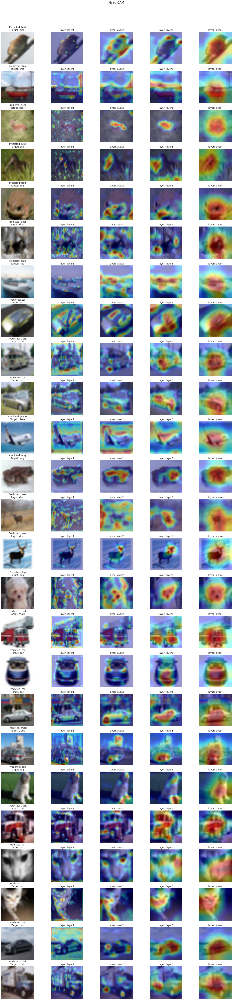

In [16]:
plot_gradcam(gcam_layers, data, target, predicted_classes,classes, denorm)

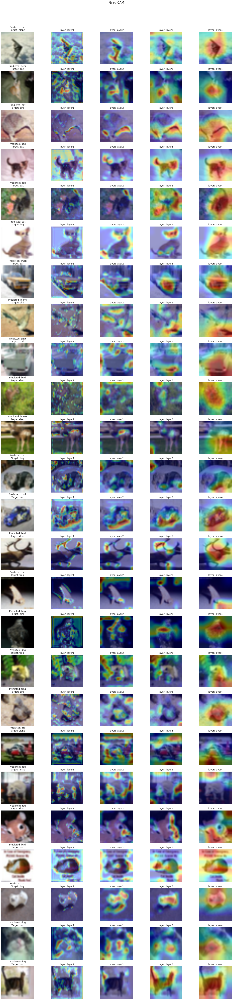

In [17]:
gcam_layers, predicted_probs, predicted_classes,data,target = load_gradcam(test, model, device, target_layers,classified = False)
plot_gradcam(gcam_layers, data, target, predicted_classes,classes, denorm)